<a href="https://colab.research.google.com/github/skander-kerkeni/Predict_if_it_s_photo_or_other/blob/training/Livrable1_Version1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<font size=15 color='992208'><center>Livrable 1</center></font> 

**Importation des libraries**


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

**Load the TensorBoard notebook extension**

In [ ]:
%load_ext tensorboard

**Suppression tous les logs existants**

In [72]:
rm -rf ./logs/

**Importer le dossier de dataset à partir de système de fichiers local**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Exctaction du fichier "Dataset.rar"**

In [ ]:
#cd /content/drive/MyDrive/
#!unrar x Dataset_L1.rar

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Extracting  Dataset_L1/photo/photo_5001.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5002.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5003.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5004.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5005.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5006.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5007.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5008.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5009.jpg                               78%  OK 
Extracting  Dataset_L1/photo/photo_5010.jpg                               78%  OK 
Ex

In [3]:
cd /content/drive/MyDrive/

/content/drive/MyDrive


In [4]:
ls

 15.png        'Colab Notebooks'/   Dataset_L1.rar   my_model.h5   tunisie.jpg
 checkpoints/   Dataset_L1/         L1_test/         text.jpg


#1) Prepare training data

**2.** Charger les données d’apprentissage, de validation et de test de la dataset respectivement dans des conteneurs de type BatchDataset $train\_ds$ et $val\_ds$. Avec la taille des batch est 128, et la taille des images à $48\times 48$

In [5]:
batch_size = 128
img_height = 48
img_width = 48


**80% des données pour l'apprentissage et 20% pour la validation**

In [6]:
train_ds = tf.keras.utils.image_dataset_from_directory(
   directory="Dataset_L1",
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 20574 files belonging to 2 classes.
Using 16460 files for training.


In [7]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  directory="Dataset_L1",
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 20574 files belonging to 2 classes.
Using 4114 files for validation.


**Les classes du model**

In [8]:
class_names = train_ds.class_names
print(class_names)

['non-photo', 'photo']


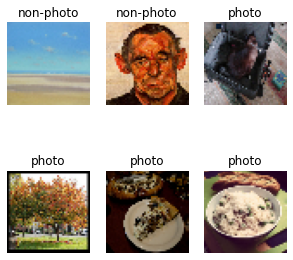

In [ ]:
plt.figure(figsize=(5, 5))
for images, labels in train_ds.take(1):
    for i in range(6):
      ax = plt.subplot(2, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(class_names[labels[i]])
      plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(128, 48, 48, 3)
(128,)


#2)Train model

**Transfer learning (VGG-16)**

In [33]:
model_vgg=tf.keras.applications.VGG16(include_top=False, weights='imagenet',
    input_shape=(48,48,3))

58900480/58889256 [==============================] - 0s 0us/step


In [34]:
model_vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 48, 48, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0     

Creation d'un nouveau modèle, 
Ce modèle comporte 6 blocs :
* Le premier bloc représente le modèle VGG16 pré-entrainé ($model\_vgg$)
* Le deuxième comporte le Flatten avec **(Global Average Pooling)**
* Le troisième bloc représente une couche de "BatchNormalisation"
* Le quatrième bloc comporte une couche cachée de **256 neurones** dont la fonction d'activation est **"relu"**
* Le cinquième bloc comporte une couche cachée de **128 neurones** dont la fonction d'activation est **"relu"**
* Le sixième bloc représente une couche sortie de **1 neurone** dont la fonction d’activation est **"sigmoid"**


In [39]:

from keras.layers.pooling import GlobalAveragePooling2D
model_vgg.trainable = False
inputs = tf.keras.Input(shape=(48,48,3))
x=model_vgg(inputs, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.BatchNormalization()(x)
x =tf.keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L1L2())(x)
x = tf.keras.layers.Dense(128,activation="relu", kernel_regularizer=tf.keras.regularizers.L1L2())(x)

outputs =tf.keras.layers.Dense(1,activation="sigmoid")(x)

#Générer le nouveau modèle 
my_model = tf.keras.Model(inputs,outputs)








In [40]:
my_model.compile(optimizer='adam', loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), metrics=['accuracy'])

**Early Stopping**

In [41]:
er_s=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)

**Call Backs**

In [42]:
from keras.callbacks import EarlyStopping,ModelCheckpoint
ch_p = ModelCheckpoint('./best_model.h5', monitor='val_accuracy', mode='max',save_best_only=True)

In [43]:
history = my_model.fit(train_ds,validation_data=val_ds,epochs=30,verbose=1,callbacks=[ch_p,er_s])

Epoch 1/30


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


129/129 [==============================] - 3235s 24s/step - loss: 0.3161 - accuracy: 0.8634 - val_loss: 0.2864 - val_accuracy: 0.8775
Epoch 2/30
129/129 [==============================] - 595s 5s/step - loss: 0.2285 - accuracy: 0.9041 - val_loss: 0.2620 - val_accuracy: 0.8894
Epoch 3/30
129/129 [==============================] - 598s 5s/step - loss: 0.1914 - accuracy: 0.9210 - val_loss: 0.2754 - val_accuracy: 0.8802
Epoch 4/30
129/129 [==============================] - 558s 4s/step - loss: 0.1565 - accuracy: 0.9374 - val_loss: 0.2720 - val_accuracy: 0.8918
Epoch 5/30
129/129 [==============================] - 618s 5s/step - loss: 0.1278 - accuracy: 0.9506 - val_loss: 0.2940 - val_accuracy: 0.8901
Epoch 6/30
129/129 [==============================] - 622s 5s/step - loss: 0.1043 - accuracy: 0.9593 - val_loss: 0.3117 - val_accuracy: 0.8904
Epoch 7/30
129/129 [==============================] - 624s 5s/step - loss: 0.0879 - accuracy: 0.9685 - val_loss: 0.3248 - val_accuracy: 0.8862
Epoch 8/

**TensorBoard Graphs**

In [71]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

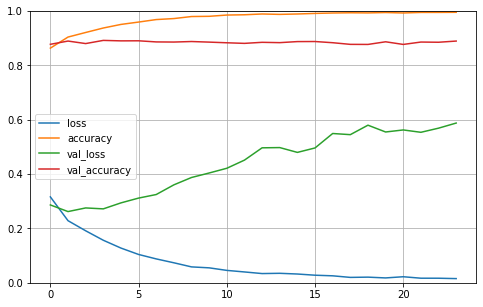

In [44]:
import pandas as pd
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

In [45]:
loss_t, acc_t = my_model.evaluate(val_ds)

print(loss_t, acc_t) 


33/33 [==============================] - 119s 3s/step - loss: 0.5882 - accuracy: 0.8894
0.588165819644928 0.8894020318984985


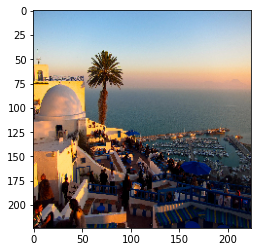

In [ ]:
img_path = "/content/drive/MyDrive/tunisie.jpg"
img = image.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.show()


**Charger le model**

In [46]:
from tensorflow import keras
reconstructed_model = keras.models.load_model("best_model.h5")

In [47]:
reconstructed_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 48, 48, 3)]       0         
                                                                 
 vgg16 (Functional)          (None, 1, 1, 512)         14714688  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 batch_normalization_6 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_18 (Dense)            (None, 256)               131328    
                                                                 
 dense_19 (Dense)            (None, 128)               3289

**Prédiction**

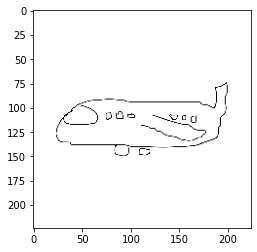

This image is NOT A PICTURE


In [57]:
import numpy as np
from keras.preprocessing import image

img_width, img_height = 48, 48
img = image.load_img('/content/drive/MyDrive/15.png', target_size = (img_width, img_height))
img = image.img_to_array(img)
img = np.expand_dims(img, axis = 0)


#Predection
result=reconstructed_model.predict(img)
#Affichage d'image 
img = image.load_img("/content/drive/MyDrive/15.png", target_size=(224, 224))
plt.imshow(img)
plt.show()
#Affichage du resultat
if(result[0][0]<0.5):
  print("This image is NOT A PICTURE")
else:
  print("This image is A PICTURE")

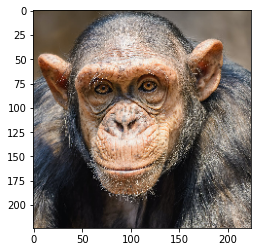

This image is A PICTURE


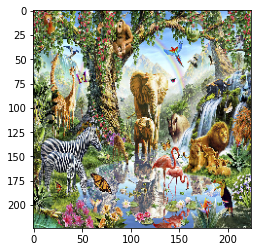

This image is NOT A PICTURE


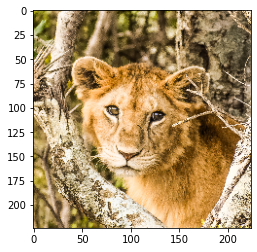

This image is NOT A PICTURE


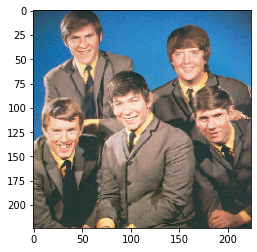

This image is A PICTURE


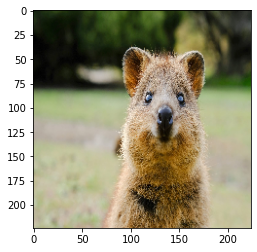

This image is A PICTURE


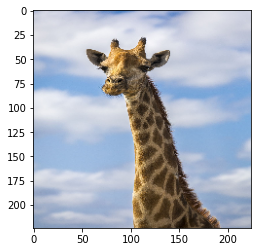

This image is A PICTURE


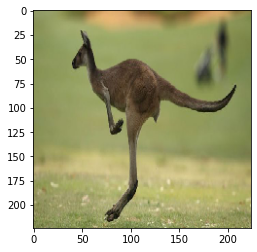

This image is A PICTURE


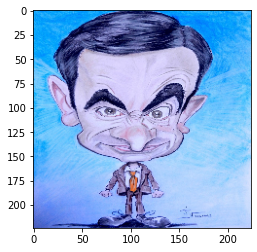

This image is NOT A PICTURE


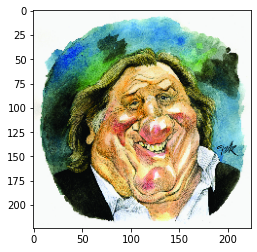

This image is A PICTURE


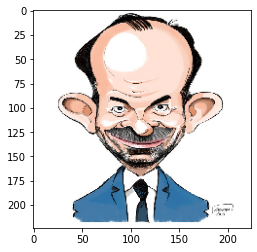

This image is NOT A PICTURE


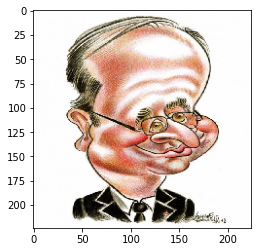

This image is NOT A PICTURE


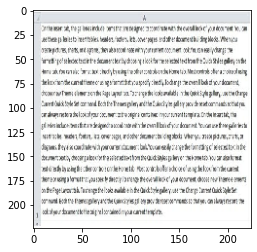

This image is NOT A PICTURE


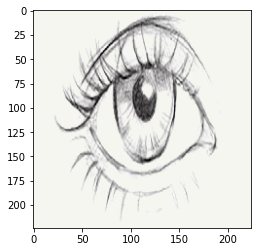

This image is NOT A PICTURE


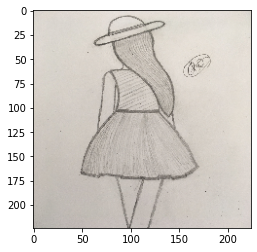

This image is NOT A PICTURE


In [64]:
import numpy as np
from keras.preprocessing import image
import glob
image_list = []
for filename in glob.glob('/content/drive/MyDrive/L1_test/*.jpg'):
  img_width, img_height = 48, 48
  img = image.load_img(filename, target_size = (img_width, img_height))
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis = 0)


  #Predection
  result=reconstructed_model.predict(img)
  #Affichage d'image 
  img = image.load_img(filename, target_size=(224, 224))
  plt.imshow(img)
  plt.show()
  #Affichage du resultat
  if(result[0][0]<0.5):
    print("This image is NOT A PICTURE")
  else:
    print("This image is A PICTURE")

**Matrice de confusion**

[[1040 1043]
 [1006 1025]]


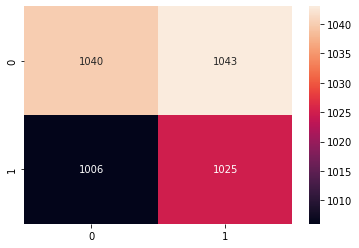

In [73]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
des_labels =  np.array([])
for x, y in val_ds:
  des_labels = np.concatenate([des_labels, y])



pred_labels=reconstructed_model.predict(val_ds)

pred_labels =(pred_labels>0.5)


cm = confusion_matrix(des_labels, pred_labels)
print(cm)
sns.heatmap(cm, annot=True, fmt='d')